# Session 5: Plotting Static and Interactive Map on Leaftlet
*Written by Men Vuthy, 2021*

---

#### Overview:

In this session, we are going to learn how to plot static and interactive map in Python. We will start from plotting normal maps using commonly-used plotting functions from `Matplotlib` library, and how to customize the map for a good-looking visulization. Then, we will learn adding different kinds of standard basemap or tiles to the static maps, and making interactive maps with various types of data features such as chorolepth map, etc. Map plotting is a very useful task in putting your data or results into a proper visulization for reports, presentations or research papers.

After this session, you will understand how to:

- plot static map with different background map
- plot interactive map with different pop-up information
- know about GitHub community and repository
- know how to create a Webpage in GitHub with various template, and how to clone repository to local computer
- know how to share your interactive map as a webpage

#### 1. Static map

From previous sessions, we have plotted several maps already using the `plot()` method in geopandas, which is actually the function from `matplotlib.pyplot` library. Here we will review this function again to plot our data before stepping into more advanced static map.

#### a. Plotting Geodataframe

* Let's first import necessary modules for plotting

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# input filepath
cali_fp = 'data/california_covid.shp'
road_fp = 'data/National_Highway_System.shp'

# read data
cali = gpd.read_file(cali_fp)
road = gpd.read_file(road_fp)

In [3]:
cali.crs

{'init': 'epsg:4326'}

* Remember to check coordinate reference in the first place.

In [4]:
print(cali.crs)
print(road.crs)

{'init': 'epsg:4326'}
{'init': 'epsg:3857'}


* Reproject `crs` of california dataframe

In [5]:
# Set CRS of Pseudo-Mercator epsg:3857
CRS_Pseudo_Mercator = road.crs

# Reproject geometries using the crs of road
cali = cali.to_crs(crs=CRS_Pseudo_Mercator)

C:\Users\a9418\AppData\Roaming\Python\Python37\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


* Basically, we can visualize the data geometry using the `.plot()` -function in Geopandas.

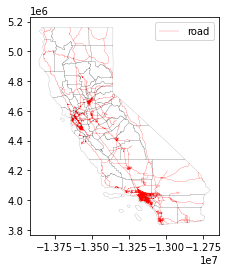

In [6]:
# add geodata to the plot
my_map = cali.plot(facecolor='None', edgecolor = 'black', linewidth = 0.1)

# Add roads on top of the california border
road.plot(ax=my_map, color="red", linewidth=0.2, label='road')

plt.legend()
plt.show();

### b. Customize plot

Here, we will add following features to the map:
* figure size
* label
* title
* legend
* color, etc.

Adding legend depends on data type. As for boundary or polygon geometric data, we can add legend by using `Patch`-function from `matplotlib.patches` module.

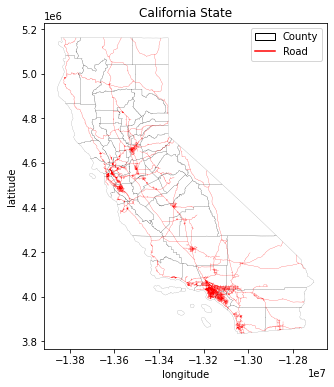

In [7]:
# adding another module for legend
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# Initialize subplots so we can set the figure size
fig, my_map = plt.subplots(figsize=(6, 6))

# add geodata to the plot
cali.plot(ax=my_map, facecolor='None', edgecolor = 'black', linewidth = 0.1)

# Add roads on top of the california border
road.plot(ax=my_map, color="red", linewidth=0.2)

# Set label
my_map.set_xlabel('longitude')
my_map.set_ylabel('latitude')

# Set title
my_map.set_title('California State')

# Add legend
plt.legend(loc='best', handles=[Patch(facecolor = 'None', edgecolor= 'black', label='County'),
                               Line2D([0], [0], color='red', label='Road')])

plt.show();

As for color, you can set it in different way whether it's the color name or color code, and matplotlib will regconized all of them. You can find the color code from [htmlcolorcodes](https://htmlcolorcodes.com) and the color map from [Colormaps in Matplotlib](https://matplotlib.org/stable/tutorials/colors/colormaps.html).

Besides, customize legend of the plotting is also a bit difficult for beginners. To adjust legend of the plot in geopandas, `mak_axes_locatable`-function is used to set the location, size, and pad of the legend. The detailed description and example are written in [Mapping and Plotting Tools](https://geopandas.org/docs/user_guide/mapping.html).

* Okay, let's try to add legend, and save figure as png

**Bar legend**


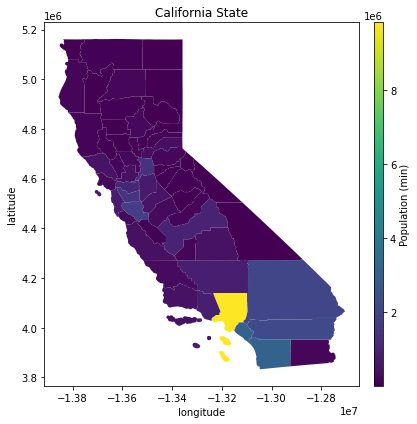

In [8]:
# Import function for customizing legend
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Initialize subplots 
fig, ax = plt.subplots(figsize=(6, 6))

# customize legend
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.2)

# add legend
cali.plot(ax=ax, column = 'POP10', 
          cmap="viridis",
          legend=True, legend_kwds={'label': "Population (min)"},
          cax=cax)



# Set label
ax.set_xlabel('longitude')
ax.set_ylabel('latitude')

# Set title
ax.set_title('California State')

# Remove the empty white-space around the axes
plt.tight_layout()

# Save the figure as png file with resolution of 150 dpi
outfp = "result/static_map_1.png"
plt.savefig(outfp, dpi=150)

**Box legend**

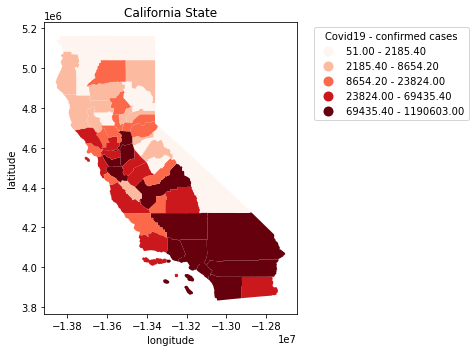

In [9]:
# Create one subplot. Control figure size in here.
fig, ax = plt.subplots(figsize=(10,5))

# Visualize the travel times into 9 classes using "Quantiles" classification scheme
cali.plot(ax=ax, 
          column="covid", 
          linewidth=0.03, 
          cmap="Reds", 
          scheme="quantiles", 
          k=5, 
          legend=True, 
          )

# Re-position the legend and set a title
ax.get_legend().set_bbox_to_anchor((1.7,1))
ax.get_legend().set_title("Covid19 - confirmed cases")

# Set label
ax.set_xlabel('longitude')
ax.set_ylabel('latitude')

# Set title
ax.set_title('California State')

# Remove the empty white-space around the axes
plt.tight_layout()

# Save the figure as png file with resolution of 150 dpi
outfp = "result/static_map_2.png"
plt.savefig(outfp, dpi=150)

#### c. Adding basemap

Sometimes, it's also important to add background map to your data visualization. In order to add the basemap or tiles, we use [contextily](https://contextily.readthedocs.io/en/latest/intro_guide.html#Fine-tune-zoom-levels), the package for contextual tiles in Python. To access contextily and get a background map to go with your geographic data is to use the `add_basemap` method. Map tiles are typically distributed in [Web Mercator projection (EPSG:3857)](https://spatialreference.org/ref/sr-org/epsg3857-wgs84-web-mercator-auxiliary-sphere/), hence it is often necessary to reproject all the spatial data into Web Mercator before visualizing the data.

* Let's first import `contextily` package

In [10]:
import contextily as ctx

* Confirm the crs of our data

In [11]:
print(cali.crs)

{'init': 'epsg:3857'}


* Next, we can plot our geodataframe and add a basemap to our plot by using a function called `add_basemap()` from contextily:

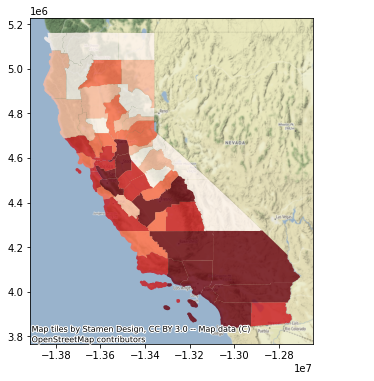

In [12]:
# Initialize subplots 
fig, my_map = plt.subplots(figsize=(6, 6))

# Classify the data feature to 5 classes using Quantiles classifier on covid confirmed cases in California
# Also add a little bit of transparency with `alpha` parameter
cali.plot(ax=my_map, column="covid", linewidth=0.03, cmap="Reds", scheme="Quantiles", k=5, alpha=0.8, legend=False)

# Add basemap
ctx.add_basemap(my_map)

Now that is how we added a basemap to the map. The default basemap is called *Stamen Terrain*. However, there are a lot of providers host, so you can switch easily between backgrounds by giving the basemap source. The list of providers are described below:

In [13]:
dir(ctx.providers)

['AzureMaps',
 'BasemapAT',
 'CartoDB',
 'CyclOSM',
 'Esri',
 'FreeMapSK',
 'Gaode',
 'GeoportailFrance',
 'HERE',
 'HEREv3',
 'HikeBike',
 'Hydda',
 'Jawg',
 'JusticeMap',
 'MapBox',
 'MapTiler',
 'MtbMap',
 'NASAGIBS',
 'NLS',
 'OPNVKarte',
 'OneMapSG',
 'OpenAIP',
 'OpenFireMap',
 'OpenRailwayMap',
 'OpenSeaMap',
 'OpenSnowMap',
 'OpenStreetMap',
 'OpenTopoMap',
 'OpenWeatherMap',
 'SafeCast',
 'Stadia',
 'Stamen',
 'Strava',
 'SwissFederalGeoportal',
 'Thunderforest',
 'TomTom',
 'USGS',
 'WaymarkedTrails',
 'nlmaps']

After determining the source provider, you can select the type of tile after source name. Check the type of tile in *Stamen* source provider.

In [14]:
dir(ctx.providers.Esri.WorldImagery)

['attribution', 'html_attribution', 'name', 'url', 'variant']

In [15]:
dir(ctx.providers.OpenStreetMap.Mapnik)

['attribution', 'html_attribution', 'max_zoom', 'name', 'url']

You can also preview each provider here: [Leaftlet-providers preview](http://leaflet-extras.github.io/leaflet-providers/preview/).

* Now, let's plot with the source provider `Stamen.TonerLite` and `Esri.WorldTerrain`.

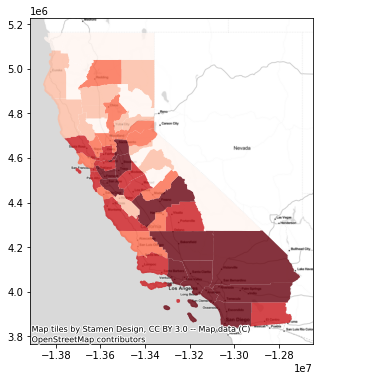

In [16]:
# Initialize subplots 
fig, my_map = plt.subplots(figsize=(6, 6))

# Add geometry
cali.plot(ax=my_map, column="covid", linewidth=0.03, cmap="Reds", scheme="Quantiles", k=5, alpha=0.8, legend=False)

# Add basemap
ctx.add_basemap(my_map, source=ctx.providers.Stamen.TonerLite)

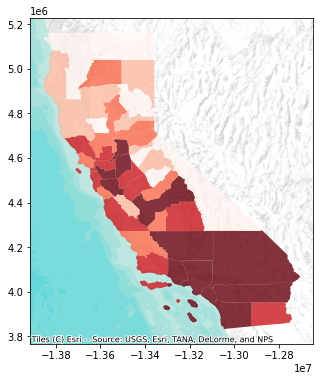

In [17]:
# Initialize subplots 
fig, my_map = plt.subplots(figsize=(6, 6))

# Add geometry
cali.plot(ax=my_map, column="covid", linewidth=0.03, cmap="Reds", scheme="Quantiles", k=5, alpha=0.8, legend=False)

# Add basemap
ctx.add_basemap(my_map, source=ctx.providers.Esri.WorldTerrain)

**Cropping map layout**

In order to zoom the map in or out, we normally set the limit of x and y axis by using the function called `.set_xlim()` and `.set_ylim()`. See example below:

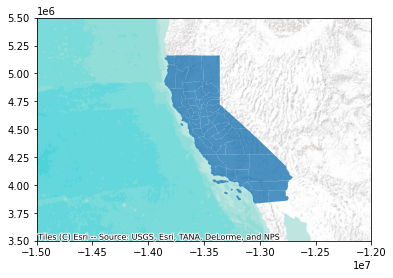

In [18]:
# Initialize subplots 
fig, my_map = plt.subplots(figsize=(6, 6))

# Crop the figure 
my_map.set_xlim(-15000000, -12000000)
my_map.set_ylim(3500000, 5500000)

# Add geometry
cali.plot(ax=my_map, alpha=0.8, legend=False)

# Add basemap
ctx.add_basemap(my_map, zoom=5, source=ctx.providers.Esri.WorldTerrain)

**Adding basemap from URL**

Not all provider sources would work when we add to the map because you might need to register to receive the access token for using their basemap. Sometimes, you also need to add url or link to the basemap by yourself. To do so, we need to parse its url in a way that contextily wants them to be. Let's see the example below that we add map from [CARTO basemap styles](https://github.com/CartoDB/basemap-styles#1-web-raster-basemaps):

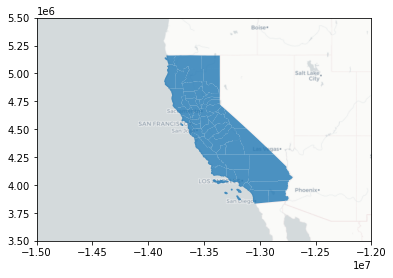

In [19]:
# Initialize subplots 
fig, my_map = plt.subplots(figsize=(6, 6))

# Crop the figure 
my_map.set_xlim(-15000000, -12000000)
my_map.set_ylim(3500000, 5500000)

# The formatting should follow: 'https://{s}.basemaps.cartocdn.com/{style}/{z}/{x}/{y}{r}.png'
# Specify the style to use
style = "light_all"
cartodb_url = 'https://a.basemaps.cartocdn.com/%s/{z}/{x}/{y}.png' % style

# Add geometry
cali.plot(ax=my_map, alpha=0.8, legend=False)

# Add basemap
ctx.add_basemap(my_map, zoom=5, source=cartodb_url)


So now we have light basemap token from CartoDB. You can use this method with other urls for different basemap from [leaflet-providers](http://leaflet-extras.github.io/leaflet-providers/preview/).

---

#### 2. Interactive map

In this section, we will learn how to plot interactive maps using Leaflet. To plot on Leaflet map, we use `Folium`, a Python library used to visualize data.

#### a. Creating a simple interactive map

Let’s create a simple interactive map without any data on it. We just visualize `CartoDB positron` on a specific location of the a world.

In [20]:
# import folium module
import folium

In [21]:
# Create an interactive map
m = folium.Map(location=[11.549816028087228, 104.996065119751], zoom_start=10, tiles='CartoDB positron', control_scale=True)

As you can see, making map using `folium` take few necessary inputs such as:

- `Location`: takes lat and lon values as an input to determine where to show in the map
- `zoom_start`: determine the zoom level of the map
- `tiles`: determine what basemap to be used as background. Check [documentation](https://python-visualization.github.io/folium/modules.html#folium.folium.Map).
- `control_scale`: take Boolean value (True or False) to show the scale bar on the map

Let’s see what our map looks like:

In [22]:
m

#### b. Adding custom basemap

Besides using built-in basemaps in the [documentation](https://python-visualization.github.io/folium/modules.html#folium.folium.Map), we can also add basemaps from different sources by providing the information of custom basemap and using `.add_to()`-function. Check the method to add map: [Python folium package for satellite map](https://gis.stackexchange.com/questions/290861/python-folium-package-for-satellite-map) and [Beginner guide to python Folium](https://bikeshbade.com.np/tutorials/Detail/?title=Beginner+guide+to+python+Folium+module+to+integrate+google+earth+engine&code=8).

Let's see how to add custom basemap:

**Google Map**

In [23]:
# Create a Map instance
m = folium.Map(location=[11.549816028087228, 104.996065119751], zoom_start=10, tiles='OpenStreetMap', control_scale=True)

# Add custom base maps to folium
Google_Map = folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Maps',
        overlay = True,
        control = True
    ).add_to(m)

m

**Esri Satellite**

In [24]:
# Create a Map instance
m = folium.Map(location=[11.549816028087228, 104.996065119751], zoom_start=10, tiles='OpenStreetMap', control_scale=True)

Esri_Satellite = folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True
       ).add_to(m)

m

**Google Satellite Hybrid**

In [25]:
# Create a Map instance
m = folium.Map(location=[11.549816028087228, 104.996065119751], zoom_start=10, tiles='OpenStreetMap', control_scale=True)

Google_Satellite_Hybrid = folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Satellite Hybrid',
        overlay = True,
        control = True
    ).add_to(m)

m

#### c. Saving map as html

To save interactive map as html, we can do it in a similar way we save other output we learned before. We can just set the extension `.html` and `save()`-function. Let’s save the map above as a html file `CartoDB_map.html`:

In [26]:
# set output filepath
outfp = 'result/CartoDB_map.html'

# save file to folder
m.save(outfp)

#### d. Adding layers

There are many options in adding layers to the map. 

**Point or Marker**

Let's start by adding a simple marker to our map by using function [folium.Marker()](https://python-visualization.github.io/folium/modules.html?highlight=marker#folium.map.Marker.)

In [27]:
# Create a Map instance
m = folium.Map(location=[11.549816028087228, 104.996065119751], zoom_start=10, tiles='OpenStreetMap', control_scale=True)

# Add marker
folium.Marker(
    location=[11.564284459999666, 104.93113969788683],
    popup='Royal Palace',
    icon=folium.Icon(color='red', icon='home'),
).add_to(m)

#Show map
m

**Icons** : There are many icons you can find. You can run the code `help(folium.Icon)` to see the detail information about Icon in module folium.map or set the icon name from [Ionicons](https://ionic.io/ionicons).


* Let's add a point list of Bicycle Theft in London that we have created from session 4.

In [28]:
import geopandas as gpd

# Filepath of bicycle data
bike_fp = 'data/bicycle_theft_London.shp'

# Read dataframe
# Length of data is too long for computer to run, so let's select 2% of random points from the total data
bike = gpd.read_file(bike_fp).sample(frac =.02)

print(len(bike))

228


In [29]:
bike

,FID,geometry
3107,3107,POINT (538111.972 189364.987)
2082,2082,POINT (528146.006 174656.978)
8996,8996,POINT (516377.011 178781.048)
4002,4002,POINT (514030.988 169733.988)
6247,6247,POINT (525223.997 184235.997)
...,...,...
7580,7580,POINT (541874.011 183722.955)
7009,7009,POINT (512808.019 175132.948)
3463,3463,POINT (533606.020 187073.001)
9026,9026,POINT (529264.967 192450.045)


* In folium map, Map tiles are typically distributed in Web Mercator projection - `WGS 84 (EPSG:4326)`, hence it is necessary to reproject all the spatial data into Web Mercator before visualizing the data.

In [30]:
Bike = bike.to_crs(epsg=4326)

C:\Users\a9418\AppData\Roaming\Python\Python37\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


* In folium map, it's better to add point as a point list because it will be convenient when you want to customize the point info and shape.

In [31]:
# Create a point list from bicycle theft geometry in the following format
Bike_coord = [[point.xy[1][0], point.xy[0][0]] for point in Bike.geometry ]

* Adding markers to map

In [32]:
# Create a Map instance
m = folium.Map(location=[51.5, -0.0853387883651203], tiles = 'Cartodb dark_matter', zoom_start=10, control_scale=True)

# Write a loop to add points one by one to the map
for coordinates in Bike_coord:
    m.add_child(folium.Marker(location = coordinates, icon = folium.Icon(color = 'lightgray', icon='ok-sign')))

m

* Add markers with ID popup 

In [33]:
# Create a Map instance
m = folium.Map(location=[51.5, -0.0853387883651203], tiles = 'Cartodb dark_matter', zoom_start=10, control_scale=True)

# Write a loop to add points and ID one by one to the map 
for coordinates, ID in zip(Bike_coord, Bike.FID) :
    m.add_child(folium.Marker(location = coordinates, popup = ID , icon = folium.Icon(color = 'lightgray', icon='ok-sign')))

m

**Polygon**

A polygon geometry can be added to interactive map by using `folium.features.GeoJson()`. Let's first import London boundary data.

In [34]:
# Filepaths
fp = "data/greater_london_const_region.shp"

# Read Data
london = gpd.read_file(fp)

# Check the data
london.head(2)

,NAME,AREA_CODE,DESCRIPTIO,FILE_NAME,NUMBER,NUMBER0,POLYGON_ID,UNIT_ID,CODE,HECTARES,AREA,TYPE_CODE,DESCRIPT0,TYPE_COD0,DESCRIPT1,geometry
0,Havering and Redbridge GL Assembly Const,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,1,1,112074,41452,E32000009,17089.120,215.025,VA,CIVIL VOTING AREA,None,None,"POLYGON ((552057.328 178434.366, 552047.261 17..."
1,Croydon and Sutton GL Assembly Const,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,2,2,112056,41443,E32000005,13033.641,0.000,VA,CIVIL VOTING AREA,None,None,"POLYGON ((531409.308 171042.621, 531439.333 17..."


* Besides adding polygon geometry to the map, let's also set the layer selection button visible by using `folium.LayerControl()`-function.

In [35]:
# Create a Map instance
m = folium.Map(location=[51.5, -0.0853387883651203], tiles = 'Cartodb dark_matter', zoom_start=10, control_scale=True)

# Plot a polygon map
folium.features.GeoJson(london['geometry'], name='London').add_to(m)

# Add control layer
folium.LayerControl(collapsed=False).add_to(m)

#Show map
m

C:\Users\a9418\AppData\Roaming\Python\Python37\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


*Customize polygon map:* https://nbviewer.jupyter.org/gist/jtbaker/57a37a14b90feeab7c67a687c398142c?flush_cache=true

**Multiple layers**

In order to create more layers, we use the function called `folium.FeatureGroup()`, and then we use `folium.LayerControl()` to show a button for layer selection.

In [36]:
# Create a Map instance
m = folium.Map(location=[51.5, -0.0853387883651203], tiles = 'Cartodb dark_matter', zoom_start=10, control_scale=True)

# Plot a polygon map
folium.features.GeoJson(london['geometry'],
                       name='London'
                       ).add_to(m)

# Create a layer for bicycle theft
bike_layer = folium.FeatureGroup(name="Bicycle theft")

# Write a loop to add points and ID one by one to the created layer 
for coordinates, ID in zip(Bike_coord, Bike.FID) :
    bike_layer.add_child(folium.Circle(location = coordinates, popup = ID , radius=1, weight= 5, color='yellow'))

# Add bike layer to map
bike_layer.add_to(m)

# Add control layer
folium.LayerControl(collapsed=False).add_to(m)

#Show map
m

C:\Users\a9418\AppData\Roaming\Python\Python37\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


#### b. Heatmap

[Heatmap plugin](https://python-visualization.github.io/folium/plugins.html#folium.plugins.HeatMap) is available in Folium plugins, which a popular one in leaflet that creates a heatmap layer from input points. There are two ways to import the function such as : `from folium import plugins` or `from folium.plugins import Heatmap`.

In [37]:
from folium import plugins

# Create a Map instance
m = folium.Map(location=[51.5, -0.0853387883651203], tiles='cartodbpositron', zoom_start = 10, control_scale=True)

# Add input layer of bicycle coordinate
plugins.HeatMap(Bike_coord).add_to(m)

m

#### c. Choropleth map

Choropleth map is a very common map plot in folium. To plot this map, we use `folium.Choropleth`-function which can read the geometries and attributes directly from a geodataframe. Check out how to plot [Choropleth map](https://www.python-graph-gallery.com/292-choropleth-map-with-folium).

As for our case, we will plot Choropleth map using the world data from geopandas dataset. This data is descibed in [Mapping and Plotting Tools](https://geopandas.org/docs/user_guide/mapping.html).

In [38]:
import geopandas as gpd

* Let's import data from geopandas dataset using `geopandas.datasets.get_path`

In [39]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [40]:

# Create a Geo-id which is needed by the Folium (it needs to have a unique identifier for each row)
world['geoid'] = world.index.astype(str)
world

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,geoid
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",1
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",2
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",3
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",4
...,...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",172
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",173
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",174
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",175


In [41]:
# Create a Map instance
m = folium.Map(location=[0, 0], tiles = 'cartodbpositron', zoom_start=2, control_scale=True)

# Plot a choropleth map
# Notice: 'geoid' column that we created earlier needs to be assigned always as the first column
gdp = folium.Choropleth(
    geo_data=world,
    name='World gpd per capita',
    data=world,
    columns=['geoid', 'gdp_md_est'],
    key_on='feature.id',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    line_opacity=0.2,
    highlight=True, 
    threshold_scale=9,
    legend_name= 'World GDP per capita').add_to(m)

# Add control layer
folium.LayerControl(collapsed=True).add_to(m)

#Show map
m

C:\Users\a9418\AppData\Roaming\Python\Python37\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


#### d. Tooltip

Tooltip is a method to add pop-up messages to the map. Tooltip works when plotting the polygons as GeoJson objects using `features.GeoJsonTooltip`. Let's see how to add pop-up message with this tooltip method.

In [42]:
# Create a Map instance
m = folium.Map(location=[0, 0], tiles = 'cartodbpositron', zoom_start=2, control_scale=True)

folium.features.GeoJson(world[['geometry','name','gdp_md_est']],
                        name="World GDP per capita",
                        style_function=lambda x: {'color':'red','fillColor':'transparent','weight':0.3},
                        highlight_function=lambda x: {'weight':1, 'color':'green', 'fillColor':'green'},
                        tooltip=folium.features.GeoJsonTooltip(fields=['name','gdp_md_est'],
                                              aliases= ['Country', 'GDP per capita'],
                                              labels=True, 
                                              sticky=True
                                             )
              ).add_to(m)

# Add control layer
folium.LayerControl(collapsed=True).add_to(m)

# Show map
m

C:\Users\a9418\AppData\Roaming\Python\Python37\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Read more about Tooltip in the code [here](https://nbviewer.jupyter.org/gist/jtbaker/57a37a14b90feeab7c67a687c398142c?flush_cache=true)

In [43]:
# set output filepath
outfp = 'result/world_gdp.html'

# save file to folder
m.save(outfp)

---

**Additional Resources**

https://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/

**Github template**

- https://html5up.net